#  Neural Style Transfer
##### (Combination of Deep Learning & Art)
It merges two images, namely: a "content" image (C) and a "style" image (S), to create a "generated" image (G). 

The eponymously named VGG network from the [original NST paper](https://arxiv.org/abs/1508.06576) published by the Visual Geometry Group at University of Oxford in 2014, will be used. Specifically, using VGG-19, a 19-layer version of the VGG network.
- Implementing the neural style transfer algorithm 
- Generating novel artistic images using the algorithm 
- Defining the style cost function for Neural Style Transfer
- Defining the content cost function for Neural Style Transfer

## steps followed by code:
- 1- Transfer Learning
- 2- Neural Style Transfer (NST):
 - Computing the Content Cost:
    - Make Generated Image G Match the Content of Image C
    - Content Cost Function  𝐽𝑐𝑜𝑛𝑡𝑒𝑛𝑡(𝐶,𝐺) --> compute_content_cost
 - Computing the Style Cost
    - Style Matrix -->  gram_matrix
    - Style Cost --> compute_layer_style_cost
    - Style Weights --> compute_style_cost
 - Defining the Total Cost to Optimize --> total_cost
- 3- Solving the Optimization Problem:
 - Load the Content Image
 - Load the Style Image
 - Randomly Initialize the Image to be Generated
 - Load Pre-trained VGG19 Model
 - Compute Total Cost
     - Compute Content Cost
     - Compute Style Cost --> train_step
 - Train the Model
 

In [2]:
import os
import sys
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
import pprint
from public_tests_neural import *
%matplotlib inline

### 1- Transfer Learning:

The eponymously named VGG network from the [original NST paper](https://arxiv.org/abs/1508.06576) published by the Visual Geometry Group at University of Oxford in 2014, will be used. Specifically, using VGG-19, a 19-layer version of the VGG network.

The following code loads parameters from the VGG model:

In [4]:
tf.random.set_seed(272) 
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='E:/new CV/DL/DL_projects/art_generation_neural_style_transfer/pretrained-model/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')

vgg.trainable = False
pp.pprint(vgg)

### 2 - Neural Style Transfer (NST):

Building the Neural Style Transfer (NST) algorithm in three steps:

- First, Building the content cost function $J_{content}(C,G)$
- Second, Building the style cost function $J_{style}(S,G)$
- Finally, putting all together to get $J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$. 

### Computing the Content Cost:

#### To forward propagate image "C:"
* Setting the image C as the input to the pretrained VGG network, and running forward propagation.  
* Letting $a^{(C)}$ be the hidden layer activations in the chosen layer.

#### To forward propagate image "G":
* Repeatng this process with the image G: Setting G as the input, and running forward propagation. 
* Letting $a^{(G)}$ be the corresponding hidden layer activation. 

The content image (C) shows the Louvre museum's pyramid surrounded by old Paris buildings, against a sunny sky with a few clouds.


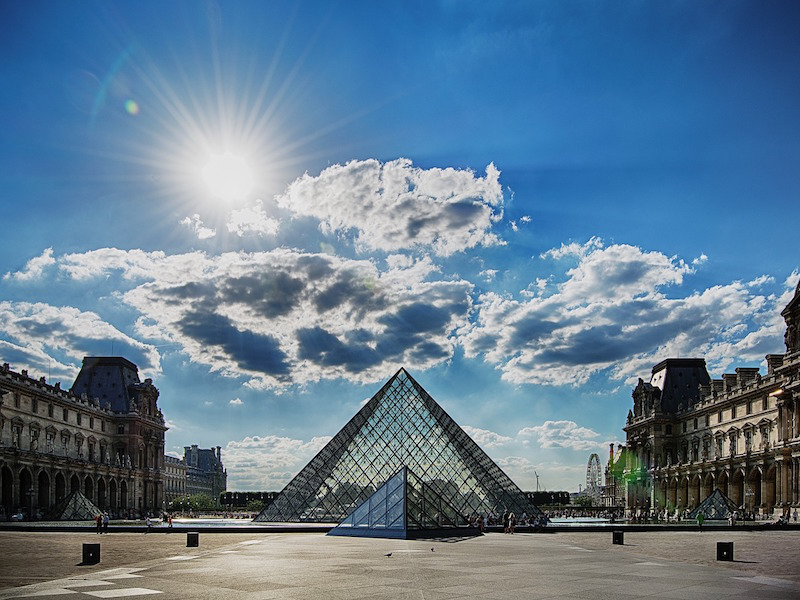

In [5]:
content_image = Image.open("E:/new CV/DL/DL_projects/art_generation_neural_style_transfer/images/louvre.jpg")
print("The content image (C) shows the Louvre museum's pyramid surrounded by old Paris buildings, against a sunny sky with a few clouds.")
content_image

####  Content Cost Function --> 𝐽𝑐𝑜𝑛𝑡𝑒𝑛𝑡(𝐶,𝐺):
$J_{content}(C,G) =  \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{ \text{all entries}} (a^{(C)} - a^{(G)})^2\tag{1} $
* $n_H, n_W$ and $n_C$ are the height, width and number of channels of the chosen hidden layer, and appear in a normalization term in the cost. 

**a_G**: hidden layer activations representing content of the image G

**a_C**: hidden layer activations representing content of the image C 

1. Retrieve dimensions from a_G
2. Reshape 'a_C' and 'a_G' 
3. Compute the content cost 

In [6]:
def compute_content_cost(content_output, generated_output):
    """
    Computes the content cost
    
    Arguments:
    a_C -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image C 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image G
    
    Returns: 
    J_content -- scalar that you compute using equation 1 above.
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]
    
    # Retrieve dimensions from a_G 
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape 'a_C' and 'a_G' 
    a_C_unrolled = tf.transpose(tf.reshape(a_C, [n_H * n_W, n_C]))
    a_G_unrolled = tf.transpose(tf.reshape(a_G, [n_H * n_W, n_C]))
    
    # compute the cost with tensorflow 
    J_content = (1 / (4*n_H*n_W*n_C)) * tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled, a_G_unrolled)))
   
    return J_content

In [7]:
compute_content_cost_test(compute_content_cost)

J_content = tf.Tensor(7.0568767, shape=(), dtype=float32)
All tests passed


### Computing the Style Cost:

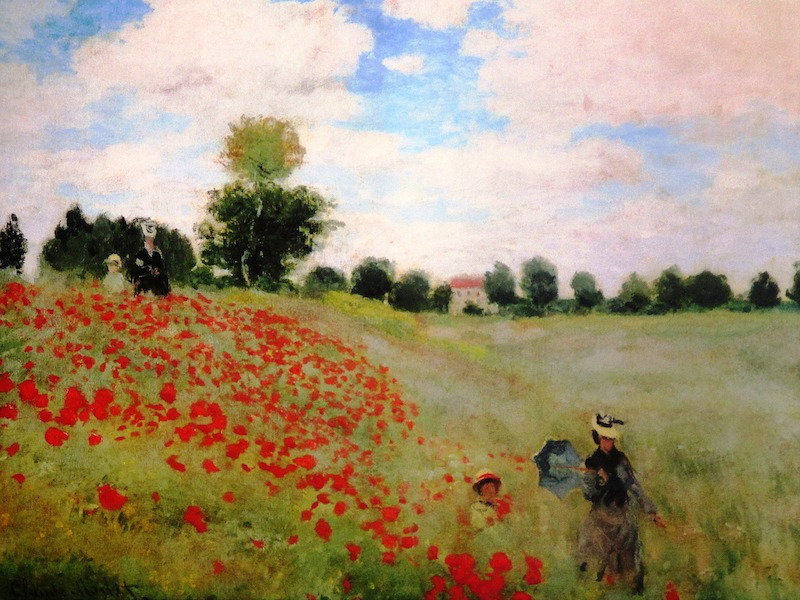

In [8]:
example = Image.open("E:/new CV/DL/DL_projects/art_generation_neural_style_transfer/images/monet_800600.jpg")
example

#### Style Matrix:

$G_{ij}$ compares how similar $v_i$ is to $v_j$: If they are highly similar, they will have a large dot product, and thus for $G_{ij}$ to be large. 

* $G$ is used to denote the Style matrix (or Gram matrix) 
* $G$ also denotes the generated image. 

Implementing a function that computes the Gram matrix of a matrix A: $$\mathbf{G}_{gram} = \mathbf{A}_{unrolled} \mathbf{A}_{unrolled}^T$$

In [9]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)
    
    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """  
    GA = tf.matmul(A, tf.transpose(A))
    
    return GA

####  Style Cost --> compute_layer_style_cost:
Minimizing the distance between the Gram matrix of the "style" image S and the Gram matrix of the "generated" image G.

* Using only a single hidden layer $a^{[l]}$ --> so the corresponding style cost for this layer is: 

$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{(gram)i,j} - G^{(G)}_{(gram)i,j})^2\tag{2} $$

* $G_{gram}^{(S)}$ Gram matrix of the "style" image.
* $G_{gram}^{(G)}$ Gram matrix of the "generated" image.


In [10]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G
    
    Returns: 
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
  
    # Retrieve dimensions from a_G 
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape the tensors from (1, n_H, n_W, n_C) to (n_C, n_H * n_W) 
    a_S = tf.transpose(tf.reshape(a_S, [n_H * n_W, n_C]))
    a_G = tf.transpose(tf.reshape(a_G, [n_H * n_W, n_C]))

    # Computing gram_matrices for both images S and G 
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # Computing the loss
    J_style_layer = (1 / (4*n_C*n_C  * (n_H*n_W) * (n_H*n_W))) * (tf.reduce_sum(tf.square(tf.subtract(GS, GG))))
    
    
    return J_style_layer

#### Style Weights --> compute_style_cost:

* "merge" style costs from several different layers. 
* Each layer will be given weights ($\lambda^{[l]}$) that reflect how much each layer will contribute to the style.
* By default, giving each layer equal weight, and the weights add up to 1.  ($\sum_{l}^L\lambda^{[l]} = 1$)

In [11]:
for layer in vgg.layers:
    print(layer.name)

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


The output of a layer block5_conv4 that will be defines  as the content layer (representing the image):

In [12]:
vgg.get_layer('block5_conv4').output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv4')>

Choosing layers to represent the style of the image and assigning style costs:

In [13]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

Combining the style costs for different layers:

$$J_{style}(S,G) = \sum_{l} \lambda^{[l]} J^{[l]}_{style}(S,G)$$

where the values for $\lambda^{[l]}$ are given in the STYLE_LAYERS. 

#### compute_style_cost:

For each layer:
* Selecting the activation (the output tensor) of the current layer.
* Getting the style of the style image "S" from the current layer.
* Getting the style of the generated image "G" from the current layer.
* Computing the "style cost" for the current layer
* Adding the weighted style cost to the overall style cost (J_style)

After all steps --> Returning the overall style cost.

In [14]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers
    
    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them
    
    Returns: 
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    
    # initialize the overall style cost
    J_style = 0
    
    # The last element of the array contains the content layer image, which must not be used.
    a_S = style_image_output[:-1]

    # The last element of the list contains the content layer image which must not be used.
    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):  
        # Compute style_cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        J_style += weight[1] * J_style_layer

    return J_style

#### Defining the Total Cost to Optimize:

Minimizing the style cost will cause the image $G$ to follow the style of the image $S$. 

Creating a cost function that minimizes both the style and the content cost:

$$J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$$

#### total_cost:


In [15]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function
    
    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost
    
    Returns:
    J -- total cost as defined by the formula above.
    """

    J = alpha*J_content + beta*J_style

    return J

In [16]:
total_cost_test(total_cost)

J = tf.Tensor(32.9832, shape=(), dtype=float32)
All tests passed


### 3- Solving the Optimization Problem:

Implementing Neural Style Transfer

1. Loading the content image 
2. Loading the style image
3. Randomly initialize the image to be generated 
4. Loading the VGG19 model
5. Computing the content cost
6. Computing the style cost
7. Computing the total cost
8. Defining the optimizer and learning rate


#### Load the Content Image:
load, reshape, and normalize the "content" image C (the Louvre museum picture):

(1, 400, 400, 3)


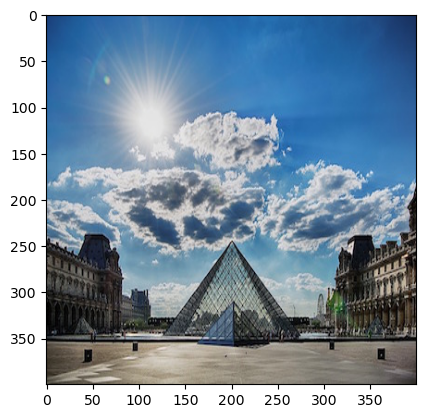

In [17]:
content_image = np.array(Image.open("E:/new CV/DL/DL_projects/art_generation_neural_style_transfer/images/louvre_small.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

####  Load the Style Image:
load, reshape and normalize the "style" image (Claude Monet's painting):

(1, 400, 400, 3)


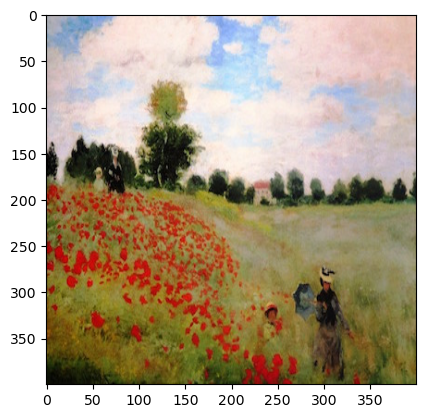

In [18]:
style_image =  np.array(Image.open("E:/new CV/DL/DL_projects/art_generation_neural_style_transfer/images/monet.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

#### Randomly Initialize the Image to be Generated:
Initializing the "generated" image as a noisy image created from the content_image.

(1, 400, 400, 3)


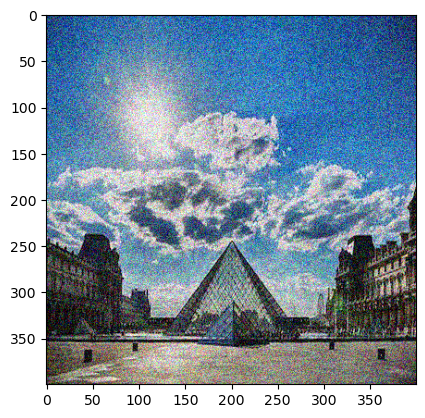

In [19]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

#### Load Pre-trained VGG19 Model:
Defining a function which loads the VGG19 model and returns a list of the outputs for the middle layers.

In [20]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

Then, defining the content layer and building the model:

In [21]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

Saving the outputs for the content and style layers in separate variables:

In [22]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image) # Style encoder

#### Compute Total Cost:

#### Compute the Content image Encoding (a_C):
 - Set a_C to be the tensor giving the hidden layer activation for layer "block5_conv4" using the content image.

In [23]:
# Assigning the content image to be the input of the VGG model.  
# Setting a_C to be the hidden layer activation
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

#### Compute the Style image Encoding (a_S):
- set a_S to be the tensor giving the hidden layer activation for `STYLE_LAYERS` using our style image.

In [24]:
# Assigning the input of the model to be the "style" image 
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

Displaying the images generated by the style transfer model:

In [25]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1
    
    Arguments:
    image -- Tensor
    J_style -- style cost coded above

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image
    
    Arguments:
    tensor -- Tensor
    
    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

###  train_step :

* Within the tf.GradientTape():
   * Compute the encoding of the generated image using vgg_model_outputs. Assign the result to a_G.
   * Compute the total cost J, using the global variables a_C, a_S and the local a_G
   * Use alpha = 10 and beta = 40.

In [26]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        
        
        # Compute a_G as the vgg_model_outputs for the current generated image
        a_G = vgg_model_outputs(generated_image)
        
        # Compute the style cost
        J_style = compute_style_cost(a_S, a_G)

        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style, alpha=10, beta=40)
        
        
    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    
    return J

In [27]:
generated_image = tf.Variable(generated_image)

train_step_test(train_step, generated_image)

tf.Tensor(25629.057, shape=(), dtype=float32)
tf.Tensor(17735.662, shape=(), dtype=float32)
All tests passed


### Train the Model:
Generating an artistic image:

Epoch 0 


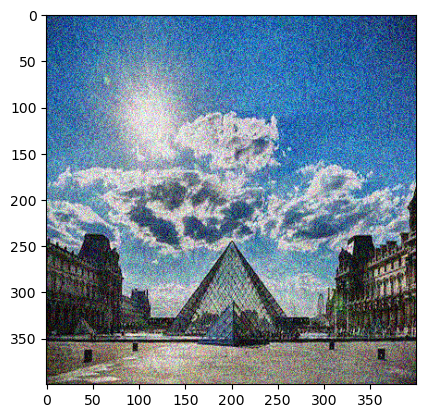

Epoch 250 


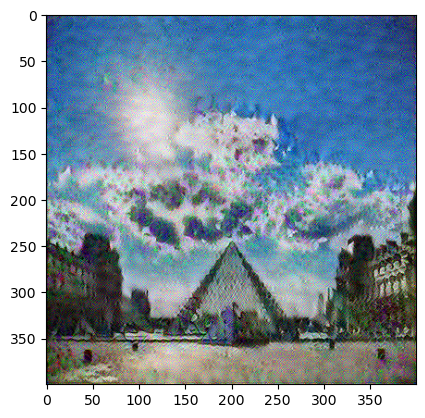

Epoch 500 


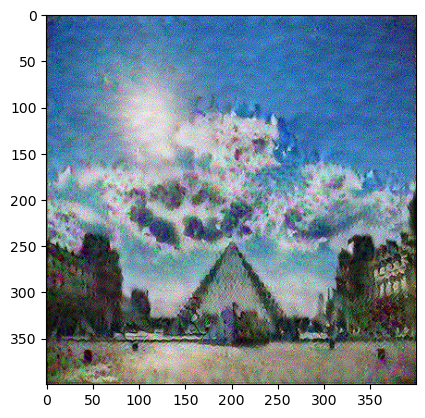

Epoch 750 


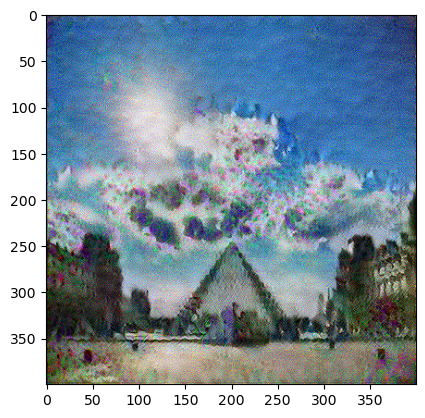

Epoch 1000 


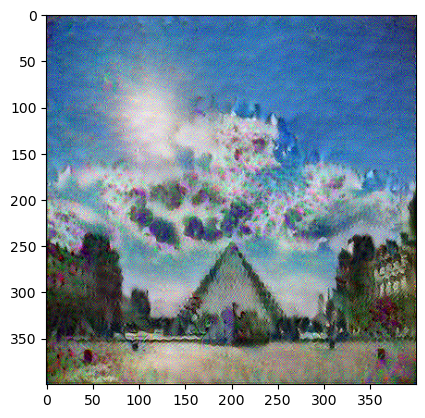

Epoch 1250 


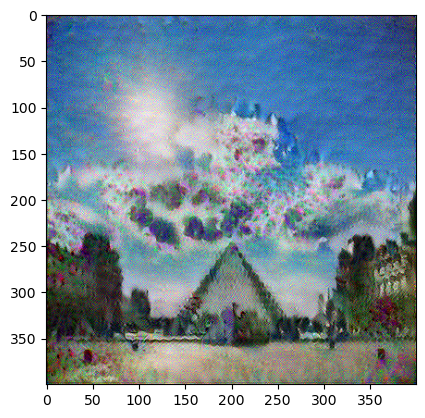

Epoch 1500 


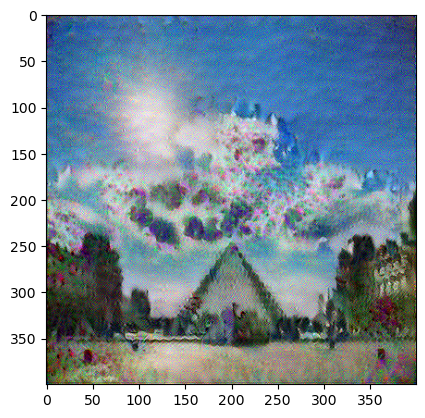

Epoch 1750 


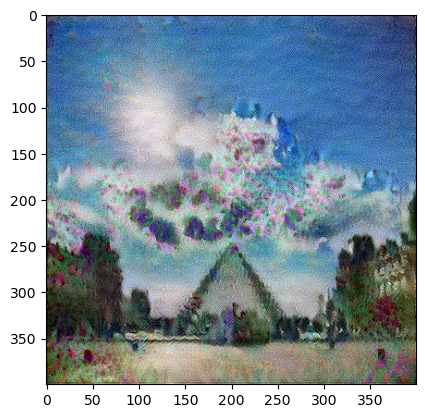

Epoch 2000 


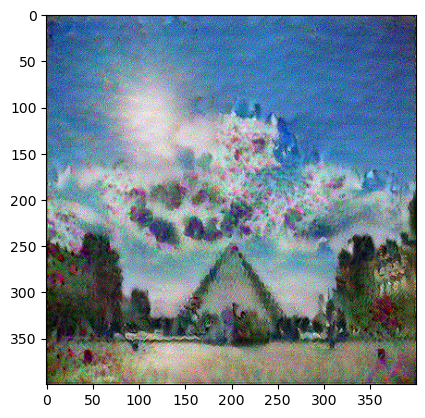

Epoch 2250 


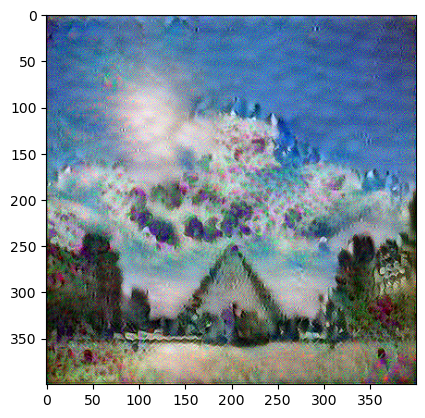

Epoch 2500 


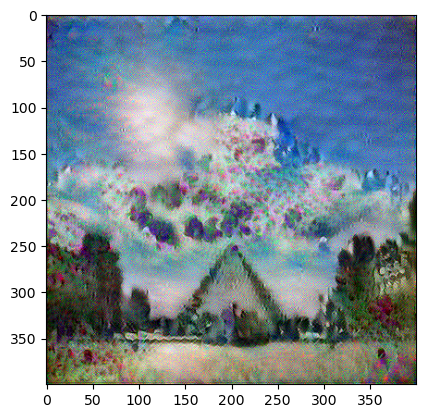

In [28]:
# Show the generated image at some epochs
epochs = 2501
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"E:/new CV/DL/DL_projects/art_generation_neural_style_transfer/output/image_{i}.jpg")
        plt.show() 

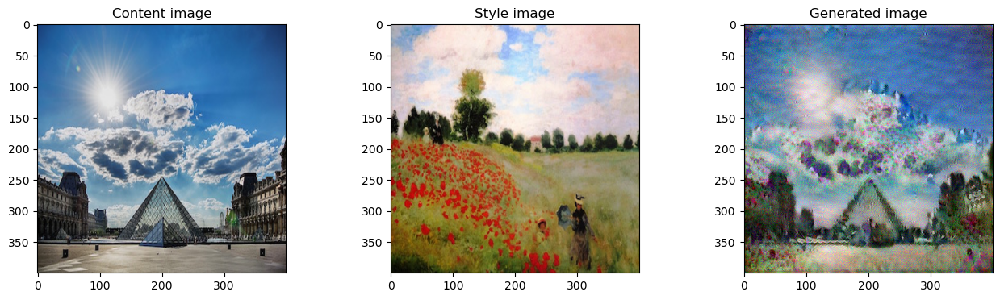

In [30]:
# Showing 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()